In [32]:
%matplotlib inline
import pickle
from pprint import pprint
import random
import warnings
import time
import numpy as np
import pandas as pd
from wordcloud import WordCloud
import seaborn as sns
import re

import gensim
from gensim.models import LdaModel
from gensim import corpora
from gensim.models import CoherenceModel
# nltk
import nltk
from nltk.corpus import wordnet as wn
from nltk.corpus import words
from nltk.stem.wordnet import WordNetLemmatizer
# split
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# ldamodel = LdaModel(corpus, 
#                     num_topics=NUM_TOPICS, 
#                     random_state=89, 
#                     id2word=dictionary, 
#                     passes=42, 
#                     per_word_topics=True,
#                     iterations= 50)

In [34]:
import os
os.chdir("/content/drive/My Drive/Colab Notebooks/Noticias_BCRP/notebooks")

In [ ]:
df_noticias_bcrp=pd.read_pickle("../data/cleaned/df_noticias_bcrp_cleanedInfo.pkl")
print(df_noticias_bcrp.shape)
df_noticias_bcrp.head()

(40586, 5)


,Texto,Texto_Limpio,Texto_Stopwords,Clean_Stopword_Info,Num_Words
0,dIZ207\n\n* FINANZAS.:.- -\n\nMomento de reest...,diz finanzas momento reestructurar las deudas ...,diz finanzas momento reestructurar deudas peia...,deudas costo financiamiento empresas años tasa...,78
1,",\nx¿ºQ Denartamento de Prensa\n\nALUEVES Y1 D...",xºq denartamento prensa alueves icembreoel rep...,xºq denartamento prensa alueves icembreoel rep...,ene construccion gasoducto sur publico privada...,248
2,TrO7\n\n \n\nECONOMISTA GONTÁLEZ IZQUIERDO\n\n...,tro economista gontalez izquierdo recomiendan ...,tro economista gontalez izquierdo recomiendan ...,izquierdo tipo cambio ahorrar jorge gonzalez i...,69
5,- 4 ENEL 2016 pégna 22\n\nFecha\n\nGESTIÓN\n\n...,enel pegna fecha gestion departamento prensa d...,enel pegna fecha gestion departamento prensa d...,inversionistas estrategia oportunidades accion...,110
6,"SiegoHarrero,geren-\ntedeinversionesde AFP\nHa...",siegoharrerogerentedeinversionesde afp habitat...,siegoharrerogerentedeinversionesde afp habitat...,afp activo desarrollados europa japon cambiari...,140


In [ ]:
text_data=[i.split() for i in df_noticias_bcrp["Clean_Stopword_Info"]]
dictionary = corpora.Dictionary(text_data)
corpus = [dictionary.doc2bow(text) for text in text_data]  
len(dictionary),len(corpus)

(14771, 40586)

In [ ]:
pickle.dump( dictionary, open( "../models/topic_modelling/dictionary.pkl", "wb" ) )
pickle.dump( corpus, open( "../models/topic_modelling/corpus.pkl", "wb" ) )

In [ ]:
from gensim.models import LdaModel
print("Training LDA model on train dataframe...")
no_of_topics=[i for i in range(20,100,5)]
for i in no_of_topics:
  NUM_TOPICS = i
  start_time = time.time()
  ldamodel = LdaModel(corpus, 
                      num_topics=NUM_TOPICS, 
                      random_state=89, 
                      update_every=1,  
                      id2word=dictionary, 
                      passes=42, 
                      alpha='auto', 
                      per_word_topics=True)
  pickle.dump( ldamodel, open( "../models/topic_modelling/lda_models/model_{}.pkl".format(NUM_TOPICS), "wb" ) )

Training LDA model on train dataframe...


In [ ]:
no_of_topics=[41,42,43,44,46,47,48,49]

In [ ]:
list_coherence=[]
for i in no_of_topics:
  ldamodel=pickle.load(open( "../models/topic_modelling/lda_models/model_{}.pkl".format(i), "rb" ))
  print("calculando coherencia topico {}".format(i))
  coherence_model_lda = CoherenceModel(model=ldamodel, texts=text_data, dictionary=dictionary, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  list_coherence.append(coherence_lda)
np.save( "../models/topic_modelling/list_coherence.npy",list_coherence)

calculando coherencia topico 20
calculando coherencia topico 25
calculando coherencia topico 30
calculando coherencia topico 35
calculando coherencia topico 40
calculando coherencia topico 45
calculando coherencia topico 50
calculando coherencia topico 55
calculando coherencia topico 60
calculando coherencia topico 65
calculando coherencia topico 70
calculando coherencia topico 75
calculando coherencia topico 80
calculando coherencia topico 85
calculando coherencia topico 90
calculando coherencia topico 95


In [ ]:
np.load( "../models/topic_modelling/list_coherence.npy",list_coherence)

In [ ]:
data={"Number of Topics":no_of_topics,
 "Coherence Scores":list_coherence}
pd.DataFrame(data)

,Number of Topics,Coherence Scores
0,20,0.631565
1,25,0.642374
2,30,0.630085
3,35,0.614522
4,40,0.611858
5,45,0.642143
6,50,0.597526
7,55,0.607405
8,60,0.609994
9,65,0.586576


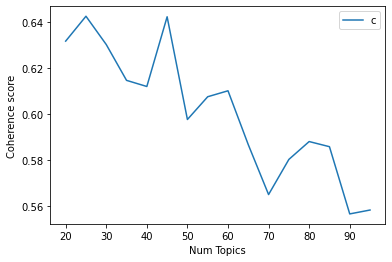

In [ ]:
# Show graph
coherence_scores = list_coherence
plt.plot(no_of_topics, coherence_scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [35]:
### Se logra un mejor performance con 45 topicos
ldamodel=pickle.load(open("../models/topic_modelling/lda_models/model_{}.pkl".format(45), "rb" ))

In [ ]:
# https://gestion.pe/blog/economiaparatodos/2013/10/que-es-el-deficit-fiscal.html/
# https://www.imf.org/es/About/Factsheets/IMF-at-a-Glance

In [ ]:
names_topic={0:"GOBIERNO EJECUTIVO",1:"ENCAJE MONETARIO",2:"SECTOR TURISMO",3:"TRANSPORTE VEHICULAR",4:"PROYECTO GASODUCTO SUR",5:"PROYECTO CHINCHEROS",
                 6:"DESARROLLO COMPETITIVO PERUANO",7:"VIVIENDA SOCIAL",8:"EMPLEO FORMAL", 9:"INVERSION PUBLICA",10:"PRECIOS DEL COMBUSTIBLE",
                 11:"DEFICIT FISCAL",12:"AGUA POTABLE",13:"LAVA JATO - ODEBRECHT",14:"PRECIOS AL CONSUMIDOR",15:"BOLSA DE VALORES LIMA",16:"CONGRESO DE LA REPUBLICA",
                 17:"COMERCIO EXTERIOR",18:"MERCADO PERUANO",19:"INVERSION PRIVADA",20:"SECTOR PESQUERO",21:"DEMANDA JUDICIAL",22:"FONDO DE PENSIONES",
                 23:"TARIFA ENERGIA ELECTRICA",24:"CIRCULACION MONEDA NACIONAL",25:"MERCADO MUNDIAL",26:"PRODUCCION PETROLERA",27:"MEDIDAS DEL MEF",
                 28:"SALUD PUBLICA",29:"FENOMENO DEL NIÑO COSTERO",30:"EXPECTATIVAS DE INFLACION",31:"RECAUDACION TRIBUTARIA - SUNAT",
                 32:"RESERVAS INTERNACIONALES NETAS",33:"INDICES DEL PBI",34:"SECTOR AGRICOLA",35:"MONEDAS ALUSIVAS",
                 36:"SECTOR MINERO",37:"TASA DE REFERENCIA",38:"PRODUCTOS DE EXPORTACION",39:"CREDITOS BANCARIOS",
                 40:"DIRECTORIO BCRP ",41:"ECONOMIA LATINOAMERICANA",42:"PROYECTOS DE LEY", 43:"TIPO DE CAMBIO",
                 44:"ECONOMIA PERUANA" }
### Analizar 
### Mercado chino y usa
### Fenomeno del niño costero y proyecto chinchero
### Economia latinoamericana
### Donde esta la balanza de pagos 

In [ ]:
topics = ldamodel.print_topics(num_topics=45)
for topic in topics:
    pprint(topic)

(0,
 '0.063*"presidente" + 0.058*"gobierno" + 0.030*"kuczynski" + 0.023*"ppk" + '
 '0.023*"pais" + 0.023*"zavala" + 0.018*"politica" + 0.015*"peruanos" + '
 '0.015*"politico" + 0.015*"peru"')
(1,
 '0.069*"encaje" + 0.025*"operaciones" + 0.021*"obligaciones" + 0.021*"banco" '
 '+ 0.019*"pago" + 0.018*"entidad" + 0.018*"pagos" + 0.018*"efectivo" + '
 '0.016*"dinero" + 0.016*"tarjetas"')
(2,
 '0.078*"dic" + 0.046*"ene" + 0.045*"turismo" + 0.041*"nov" + 0.033*"ago" + '
 '0.031*"abr" + 0.030*"feb" + 0.029*"mar" + 0.023*"pais" + 0.023*"peru"')
(3,
 '0.072*"lima" + 0.044*"san" + 0.024*"callao" + 0.021*"distritos" + '
 '0.018*"puerto" + 0.016*"contralor" + 0.015*"constructora" + 0.014*"kuntur" + '
 '0.014*"norte" + 0.012*"metro"')
(4,
 '0.058*"gas" + 0.046*"sur" + 0.044*"gasoducto" + 0.035*"proyecto" + '
 '0.031*"contrato" + 0.027*"natural" + 0.023*"gsp" + 0.018*"perupetro" + '
 '0.016*"consorcio" + 0.016*"contratos"')
(5,
 '0.047*"proyecto" + 0.029*"contrato" + 0.022*"aeropuerto" + 0.020*"chi

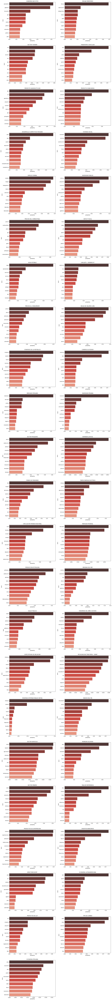

In [ ]:
### Visualizando los topicos
fig = plt.figure(figsize=(20,200))
for n,i in zip(list(names_topic.values()),range(45)):
    df = pd.DataFrame(ldamodel.show_topic(i), columns=['term','prob']).set_index('term')
    ax=fig.add_subplot(23,2,i+1)
    ax.set_title(n)
    sns.barplot(x='prob', y=df.index, data=df, label='Cities', palette='Reds_d')
    ax.set_xlabel('probability')
plt.show()

In [ ]:
## analizar bonos financieros del estado
## creciemiento economico sostenido
## produccion agricola - sectores
## crecimiento economico
## empresas comerciales, negocios comerciales empresariales
###produccion agricola - sectores

In [1]:
names_topic_1 = {1:"ENCAJE MONETARIO",37:"TASA DE REFERENCIA",32:"RESERVAS INTERNACIONALES NETAS",11:"DEFICIT FISCAL",33:"INDICES DEL PBI",43:"TIPO DE CAMBIO",30:"EXPECTATIVAS DE INFLACION"}
names_topic_2 = {13:"LAVA JATO - ODEBRECHT",16:"CONGRESO DE LA REPUBLICA",42:"PROYECTOS DE LEY",27:"MEDIDAS DEL MEF"}
names_topic_3 = {17:"COMERCIO EXTERIOR",15:"BOLSA DE VALORES LIMA",25:"MERCADO MUNDIAL",18:"MERCADO PERUANO"}
names_topic_4 = {26:"PRODUCCION PETROLERA",38:"PRODUCTOS DE EXPORTACION",36:"SECTOR MINERO",20:"SECTOR PESQUERO",14:"PRECIOS AL CONSUMIDOR",34:"SECTOR AGRICOLA",10:"PRECIOS DEL COMBUSTIBLE",23:"TARIFA ENERGIA ELECTRICA"}
names_topic_5 = { 9:"INVERSION PUBLICA",19:"INVERSION PRIVADA",39:"CREDITOS BANCARIOS", 28:"SALUD PUBLICA",22:"FONDO DE PENSIONES",8:"EMPLEO FORMAL"}

In [37]:
# a=[list(names_topic_1.keys()),
# list(names_topic_2.keys()),
# list(names_topic_3.keys()),
# list(names_topic_4.keys()),
# list(names_topic_5.keys())]
# a= [j for i in a for j in i]
import numpy as np
aux = set(np.arange(45)).difference(set(a))
aux

{0, 2, 3, 4, 5, 6, 7, 12, 21, 24, 29, 31, 35, 40, 41, 44}

In [38]:
fig = plt.figure(figsize=(30,200))
for n,(t,v) in enumerate(zip(aux,names_topic.values())):
    ax=fig.add_subplot(23,2,n+1)
    ax.imshow(WordCloud(min_font_size=5,max_font_size=70,background_color="black").fit_words( dict(ldamodel.show_topic(t,100))), interpolation='bilinear')
    ax.axis("off")
    ax.set_title("" +str(v))
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [36]:
names_topic={0:"GOBIERNO EJECUTIVO",1:"ENCAJE MONETARIO",2:"SECTOR TURISMO",3:"TRANSPORTE VEHICULAR",4:"PROYECTO GASODUCTO SUR",5:"PROYECTO CHINCHEROS",
                 6:"DESARROLLO COMPETITIVO PERUANO",7:"VIVIENDA SOCIAL",8:"EMPLEO FORMAL", 9:"INVERSION PUBLICA",10:"PRECIOS DEL COMBUSTIBLE",
                 11:"DEFICIT FISCAL",12:"AGUA POTABLE",13:"LAVA JATO - ODEBRECHT",14:"PRECIOS AL CONSUMIDOR",15:"BOLSA DE VALORES LIMA",16:"CONGRESO DE LA REPUBLICA",
                 17:"COMERCIO EXTERIOR",18:"MERCADO PERUANO",19:"INVERSION PRIVADA",20:"SECTOR PESQUERO",21:"DEMANDA JUDICIAL",22:"FONDO DE PENSIONES",
                 23:"TARIFA ENERGIA ELECTRICA",24:"CIRCULACION MONEDA NACIONAL",25:"MERCADO MUNDIAL",26:"PRODUCCION PETROLERA",27:"MEDIDAS DEL MEF",
                 28:"SALUD PUBLICA",29:"FENOMENO DEL NIÑO COSTERO",30:"EXPECTATIVAS DE INFLACION",31:"RECAUDACION TRIBUTARIA - SUNAT",
                 32:"RESERVAS INTERNACIONALES NETAS",33:"INDICES DEL PBI",34:"SECTOR AGRICOLA",35:"MONEDAS ALUSIVAS",
                 36:"SECTOR MINERO",37:"TASA DE REFERENCIA",38:"PRODUCTOS DE EXPORTACION",39:"CREDITOS BANCARIOS",
                 40:"DIRECTORIO BCRP ",41:"ECONOMIA LATINOAMERICANA",42:"PROYECTOS DE LEY", 43:"TIPO DE CAMBIO",
                 44:"ECONOMIA PERUANA" }

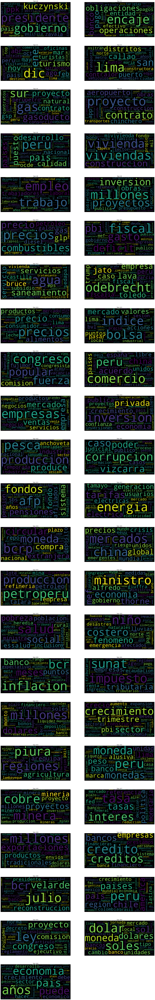

In [ ]:
fig = plt.figure(figsize=(30,200))
for t in range(ldamodel.num_topics):
    ax=fig.add_subplot(23,2,t+1)
    ax.imshow(WordCloud(min_font_size=5,max_font_size=70,background_color="black").fit_words( dict(ldamodel.show_topic(t,100))), interpolation='bilinear')
    ax.axis("off")
    ax.set_title("Topic #" +str(t))
plt.show()